# Proyek Analisis Data: Air Quality
- **Nama:** Kevin Putra Santoso
- **Email:** kevinputrasantoso@gmail.com
- **ID Dicoding:** kevinsan66

Notebook ini akan menjelaskan analisis data mulai dari eksploratif hingga eksplanatif terhadap dataset kualitas udara di Cina dalam kurun waktu 5 tahun (2013 - 2017). Terdapat 12 stasiun yang dijadikan objek pengamatan:
1. Aotizhongxin
2. Changping
3. Dingling
4. Dongsi
5. Guanyuan
6. Gucheng
7. Huairou
8. Nongzhanguan
9. Shunyi
10. Tiantan
11. Wanliu
12. Wanshouxigong

Konsentrasi gas-gas ini menunjukkan pola yang berfluktuasi, dengan beberapa tren dan korelasi yang patut diperhatikan. Selain itu, analisis curah hujan juga disajikan untuk menunjukkan tren bulanan dan tahunan. Analisis multivariat dan korelasi juga dilakukan untuk menunjukkan hubungan antara konsentrasi gas dan variabel lainnya.

## Menentukan Pertanyaan Bisnis

Beberapa pertanyaan bisnis dapat diajukan untuk mengekstrak insight penting dari data ini antara lain:  
1. Bagaimana perubahan kandungan senyawa kimia berbahaya di udara dari waktu ke waktu untuk setiap stasiun?
2. Bagaimana variabel-variabel seperti waktu, PM2.5, PM10, ..., O3 berpengaruh satu sama lain?
3. Bagaimana karakteristik persebaran senyawa kimia seperti SO2, NO2, dan CO jika dibandingkan antar stasiun?

Beberapa pendekatan yang dapat dilakukan:
- Analisis tren kandungan senyawa kimia dari waktu ke waktu
- Analisis curah hujan serta trennya
- Persebaran data angka senyawa tertinggi pada selang waktu tertentu
- Analisis Multivariat (Korelasi dan Kovarians)

## Import Semua Packages/Library yang Digunakan

In [22]:
import os # Untuk mengakses file dan direktori
import pandas as pd # Untuk membaca dan memanipulasi data
import numpy as np # Operasi matematika dan aljabar linear
import matplotlib.pyplot as plt # Visualisasi data
import seaborn as sns # Visualisasi data
from scipy.interpolate import lagrange # Untuk pengisian missing value
from sklearn.preprocessing import MinMaxScaler # Untuk normalisasi

## Data Wrangling

### Gathering Data

In [23]:
dataset_dict = {}
dataset_folder = './data'

for idx, csv_file in enumerate(os.listdir(dataset_folder)):
    dataset_dict[idx] = pd.read_csv(os.path.join(dataset_folder, csv_file))

station_dict = {
    0: dataset_dict[0]['station'][0],
    1: dataset_dict[1]['station'][0],
    2: dataset_dict[2]['station'][0],
    3: dataset_dict[3]['station'][0],
    4: dataset_dict[4]['station'][0],
    5: dataset_dict[5]['station'][0],
    6: dataset_dict[6]['station'][0],
    7: dataset_dict[7]['station'][0],
    8: dataset_dict[8]['station'][0],
    9: dataset_dict[9]['station'][0],
    10: dataset_dict[10]['station'][0],
    11: dataset_dict[11]['station'][0],
    
}

### Assessing Data

In [24]:
dataset_dict[0].head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,Aotizhongxin
1,2,2013,3,1,1,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,0.0,N,4.7,Aotizhongxin
2,3,2013,3,1,2,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,0.0,NNW,5.6,Aotizhongxin
3,4,2013,3,1,3,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,0.0,NW,3.1,Aotizhongxin
4,5,2013,3,1,4,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,0.0,N,2.0,Aotizhongxin


In [25]:
dataset_dict[1].head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,3.0,6.0,13.0,7.0,300.0,85.0,-2.3,1020.8,-19.7,0.0,E,0.5,Changping
1,2,2013,3,1,1,3.0,3.0,6.0,6.0,300.0,85.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Changping
2,3,2013,3,1,2,3.0,3.0,22.0,13.0,400.0,74.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Changping
3,4,2013,3,1,3,3.0,6.0,12.0,8.0,300.0,81.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Changping
4,5,2013,3,1,4,3.0,3.0,14.0,8.0,300.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Changping


In [26]:
dataset_dict[2].head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
1,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
3,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
4,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


In [27]:
dataset_dict[1].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34290 non-null  float64
 6   PM10     34482 non-null  float64
 7   SO2      34436 non-null  float64
 8   NO2      34397 non-null  float64
 9   CO       33543 non-null  float64
 10  O3       34460 non-null  float64
 11  TEMP     35011 non-null  float64
 12  PRES     35014 non-null  float64
 13  DEWP     35011 non-null  float64
 14  RAIN     35013 non-null  float64
 15  wd       34924 non-null  object 
 16  WSPM     35021 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


In [28]:
print("Jumlah missing values: ")
print(sum([dataset_dict[i].isnull().sum() for i in range(0, 12)]))

Jumlah missing values: 
No             0
year           0
month          0
day            0
hour           0
PM2.5       8739
PM10        6449
SO2         9021
NO2        12116
CO         20701
O3         13277
TEMP         398
PRES         393
DEWP         403
RAIN         390
wd          1822
WSPM         318
station        0
dtype: int64


### Handling Missing Values

In [29]:
class FillMissingValues:
    def __init__(self, dataset : pd.DataFrame) -> None:
        self.dataset = dataset
        self.missing_cols = [col for col in self.dataset.columns if self.dataset[col].isnull().any()]
    
    def lagrange_interpolation(self, column):
        col_copy = column.copy()
        for i in range(len(col_copy)):
            if pd.isnull(col_copy.iloc[i]):
                left_index = i - 1
                right_index = i + 1
                while left_index >= 0 and pd.isnull(col_copy.iloc[left_index]):
                    left_index -= 1
                while right_index < len(col_copy) and pd.isnull(col_copy.iloc[right_index]):
                    right_index += 1
                if left_index >= 0 and right_index < len(col_copy):
                    x = [left_index, right_index]
                    y = [col_copy.iloc[left_index], col_copy.iloc[right_index]]
                    poly = lagrange(x, y)
                    col_copy.iloc[i] = poly(i)
        return col_copy
    
    def __call__(self, *args, **kwargs):
        for col in self.missing_cols:
            try:
                self.dataset[col] = self.lagrange_interpolation(self.dataset[col])
            except ValueError:
                self.dataset[col].fillna(self.dataset[col].mode()[0], inplace=True)
        return self.dataset

In [30]:
for i in dataset_dict.keys():
    dataset_dict[i] = FillMissingValues(dataset_dict[i])()

**Note**: Dalam konteks ini, outlier sengaja tidak dihapus karena outlier ini mengindikasikan informasi penting mengenai cuaca yang berubah secara ekstrim.

## Exploratory Data Analysis

### Statistik Deskriptif

In [31]:
dataset_dict[1].describe()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,70.986438,94.788575,14.943066,44.206153,1156.990246,57.976253,13.671605,1007.771151,1.486924,0.060293,1.854871
std,10122.249256,1.177213,3.448752,8.800218,6.922285,72.397726,83.928515,21.012174,29.502709,1122.612745,54.258719,11.367457,10.226075,13.828895,0.752357,1.310748
min,1.000000,2013.000000,1.000000,1.000000,0.000000,2.000000,2.000000,0.285600,1.847700,100.000000,0.214200,-16.600000,982.400000,-35.100000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,18.000000,34.000000,2.000000,22.000000,500.000000,16.000000,3.400000,999.300000,-10.300000,0.000000,1.000000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,46.000000,72.000000,7.000000,36.000000,800.000000,46.000000,14.600000,1007.400000,1.700000,0.000000,1.500000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,100.000000,131.000000,18.000000,60.000000,1400.000000,80.000000,23.300000,1016.000000,14.200000,0.000000,2.300000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,882.000000,999.000000,310.000000,226.000000,10000.000000,429.000000,41.400000,1036.500000,27.200000,52.100000,10.000000


## Visualization & Explanatory Analysis

In [32]:
from ydata_profiling import ProfileReport

ProfileReport(dataset_dict[0], title=f"Summary data stasiun {station_dict[0]}").to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Modul Penampil Plot Tren

In [155]:
class ShowTrendPlot:
    def __init__(self, dataset_collection : dict) -> None:
        self.dataset_collection = dataset_collection
    
    def __call__(self, column='PM2.5', window=24*30*6): # Default window is 6 months
        trend_df = pd.DataFrame()
        trend_df['datetime'] = pd.to_datetime(self.dataset_collection[0][['year', 'month', 'day', 'hour']])
        for idx in self.dataset_collection.keys():
            trend_df[f"{idx}"] = self.dataset_collection[idx][column]

        trend_df.set_index('datetime', inplace=True)
        for idx in self.dataset_collection.keys():
            trend_df[f"{idx}"] = trend_df[f"{idx}"].rolling(window=window).mean()
        plt.figure(figsize=(12, 8))
        plt.plot(trend_df, label=station_dict.values())
        plt.title(f'{column} Trend Analysis over Stations', fontsize=20)
        plt.xlabel('Date')
        plt.ylabel(f'{column} Concentration')
        plt.grid()
        plt.legend()
        plt.show()

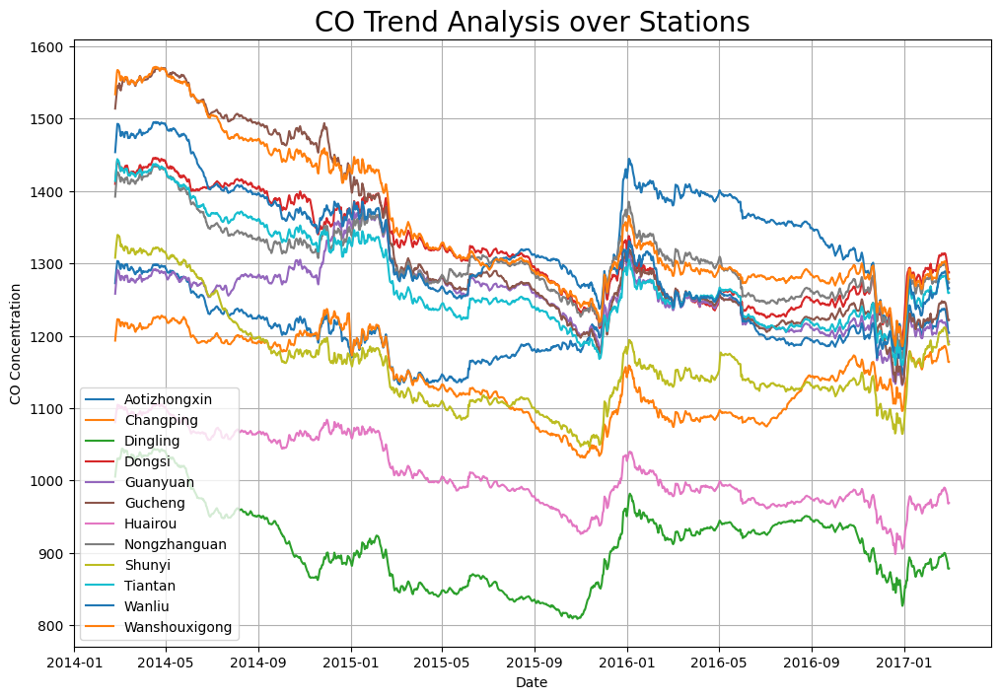

In [267]:
ShowTrendPlot(dataset_dict)(column='CO', window=24*30*12)

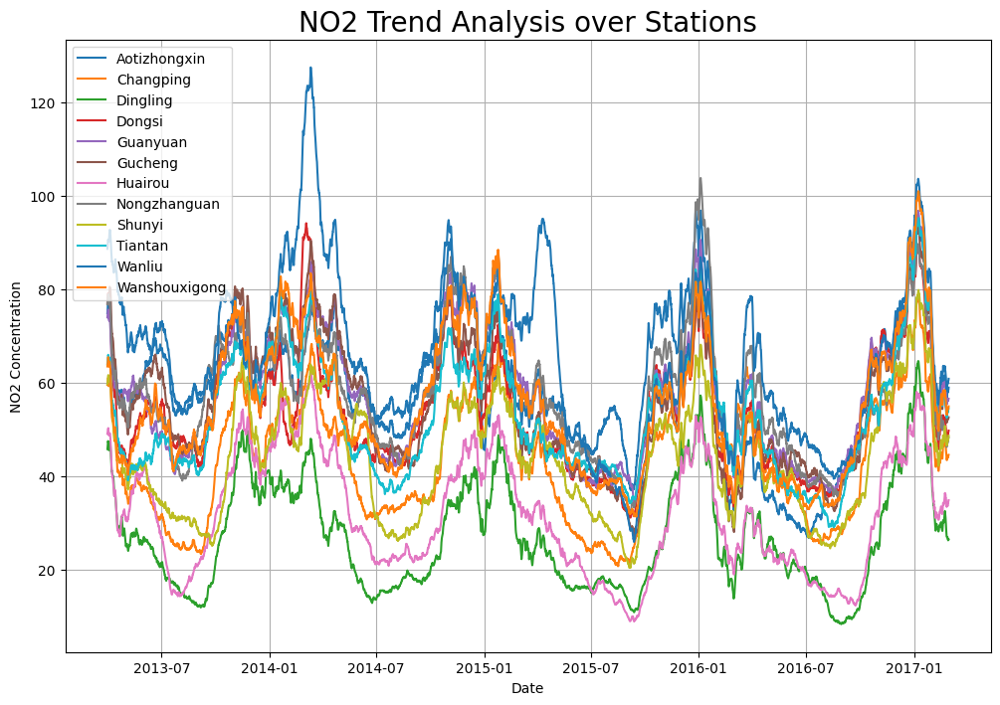

In [282]:
ShowTrendPlot(dataset_dict)(column='NO2', window=24*30)

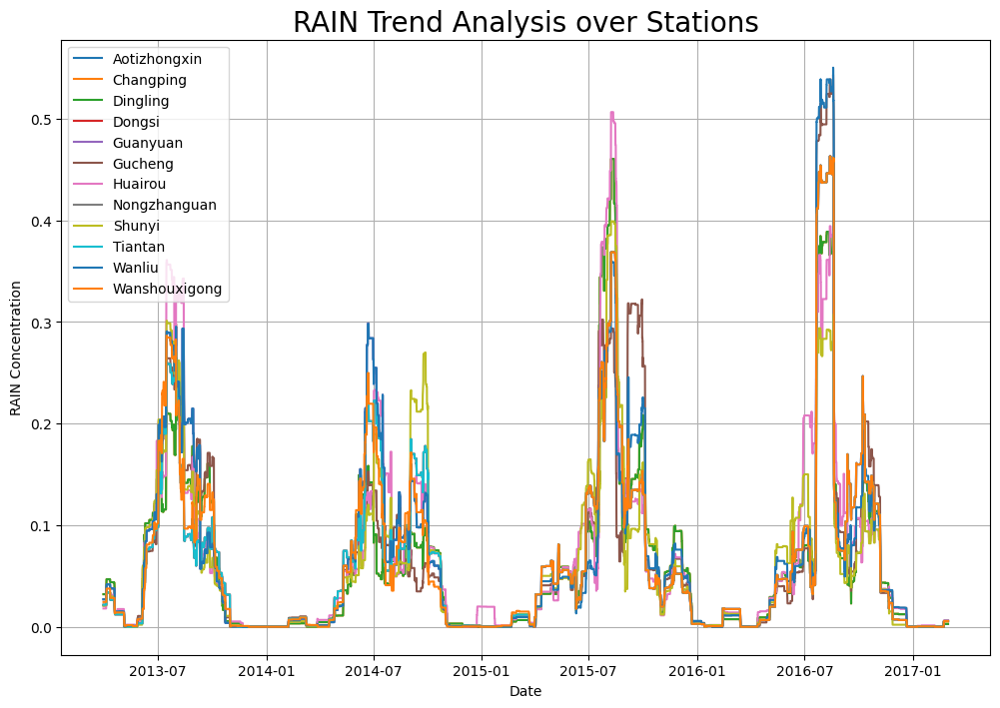

In [283]:
ShowTrendPlot(dataset_dict)(column='RAIN', window=24*30)

### Modul Penampil Plot Distribusi Variabel Per Tahun

In [189]:
class ShowDistributionPlotOverYears:
    def __init__(self, dataset : pd.DataFrame) -> None:
        self.dataset = dataset
    
    def __call__(self, column='NO2', station=station_dict[0]):
        plt.figure(figsize=(8, 5))
        years = self.dataset['year'].unique()

        for year in years:
            subset = self.dataset[self.dataset['year'] == year]
            sns.kdeplot(subset[column].dropna(), label=str(year), bw_adjust=0.6)

        plt.title(f'Persebaran Konsentrasi {column} dari Tahun 2013-2017 di Stasiun {station}', fontsize=15)
        plt.xlabel(f'Konsentrasi {column} (µg/m³)')
        plt.ylabel('Densitas')
        plt.grid()
        plt.legend(title='Tahun')
        plt.show()

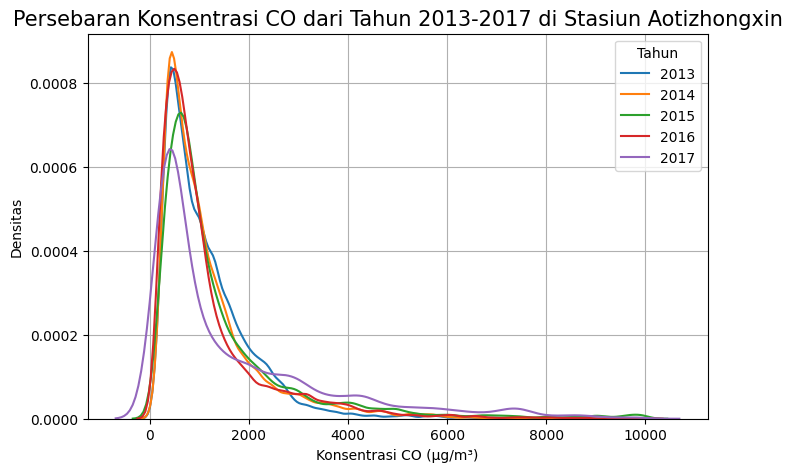

In [284]:
idx = 0
ShowDistributionPlotOverYears(dataset_dict[idx])(column='CO', station=station_dict[idx])

### Modul Plot Analisis Multivariat Distributif

In [211]:
class ShowKDEPlot:
    def __init__(self, dataset_collection : dict) -> None:
        self.dataset_collection = dataset_collection
    
    def __call__(self, station=0, labels=['CO', 'O3']):
        scaler = MinMaxScaler()
        pairs = self.dataset_collection[station][labels]
        pairs = scaler.fit_transform(pairs)
        pairs = pd.DataFrame(pairs, columns=labels)

        plt.figure(figsize=(8, 6))
        sns.jointplot(data=pairs, x=labels[0], y=labels[1], kind='kde', cmap="mako", fill=True)
        plt.xlabel(f'{labels[0]} Normalized')
        plt.ylabel(f'{labels[1]} Normalized')
        plt.show()

<Figure size 800x600 with 0 Axes>

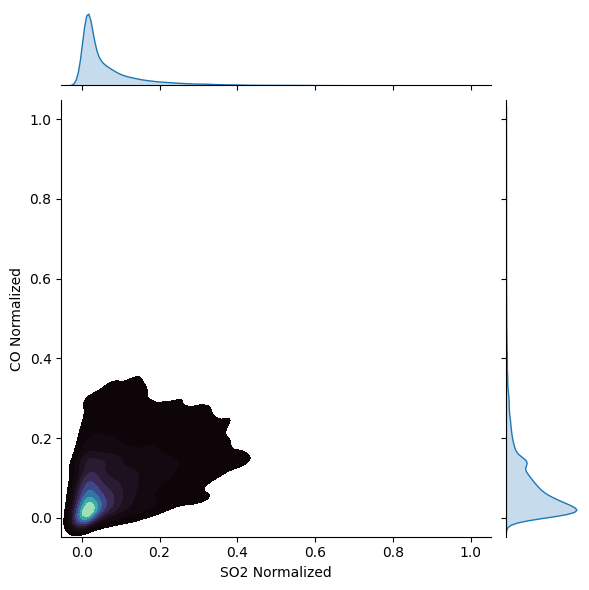

In [287]:
ShowKDEPlot(dataset_dict)(station=2, labels=['SO2', 'CO'])

### Modul Plot Matriks Korelasi

In [231]:
class ShowCorrelationDiagram:
    def __init__(self, dataset_dict: dict) -> None:
        self.dataset_dict = dataset_dict
    
    def __call__(self, station=0):
        plt.figure(figsize=(11,8))
        plt.title(f"Korelasi Antar Fitur Numerik Untuk Stasiun {station_dict[station]}", fontsize=15)
        sns.heatmap(self.dataset_dict[station][['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']].corr(), annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
        plt.show()

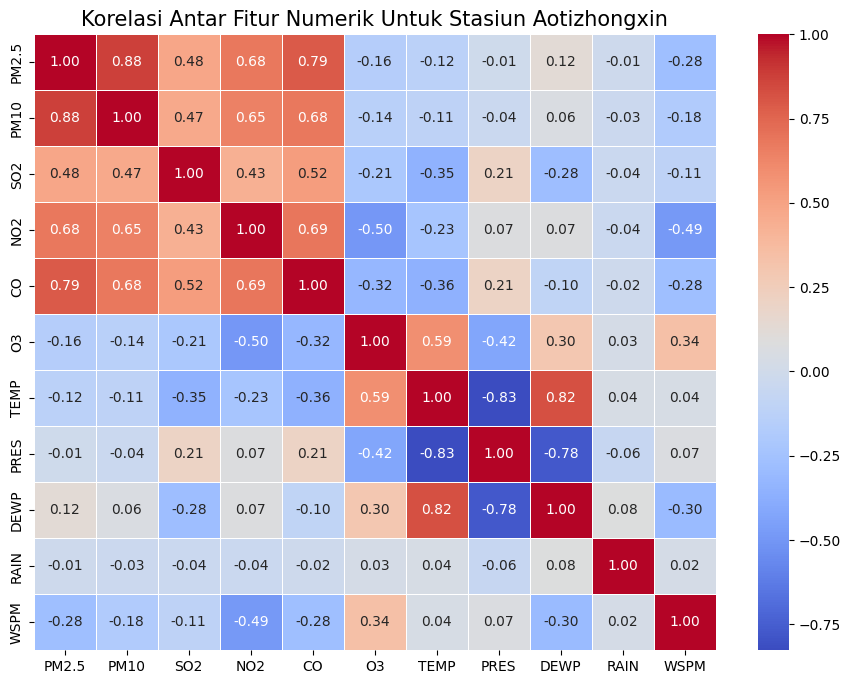

In [289]:
ShowCorrelationDiagram(dataset_dict)(station=0)

In [299]:
numerical_col = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']

corr_ = dataset_dict[0][numerical_col].corr()
for i in range(1, 12):
    corr_ += dataset_dict[i][numerical_col].corr()

corr_ /= 12

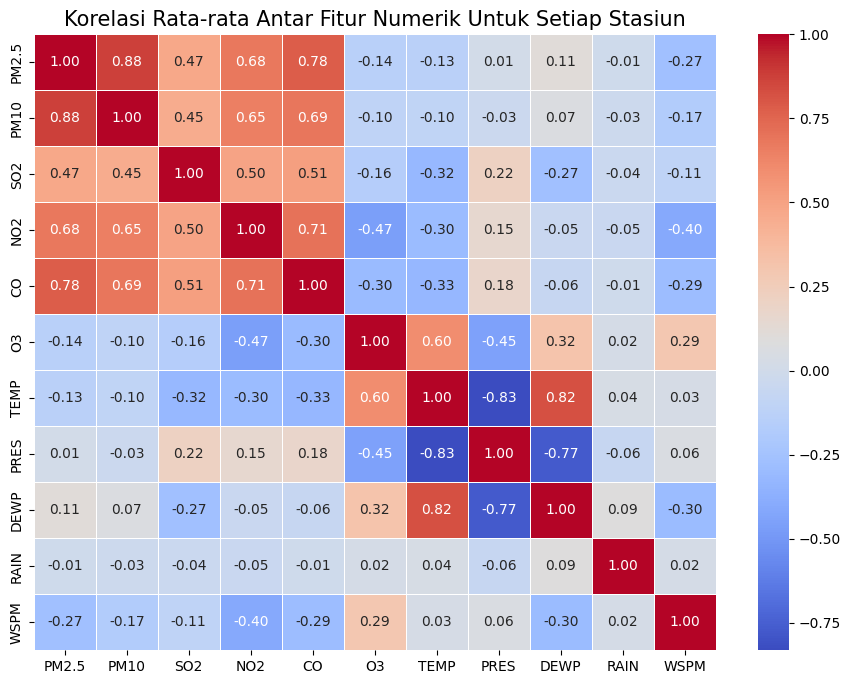

In [303]:
plt.figure(figsize=(11,8))
plt.title(f"Korelasi Rata-rata Antar Fitur Numerik Untuk Setiap Stasiun", fontsize=15)
sns.heatmap(corr_, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.show()

## Pembahasan

Analisis terhadap kandungan gas beracun seperti CO (karbonmonoksida), SO2 (sulfur dioksida), dan NO2 (nitrogen dioksida) di beberapa stasiun pengamatan di Cina mengungkapkan pola fluktuatif dalam konsentrasi CO sepanjang bulan. Penelitian ini menunjukkan penurunan konsentrasi CO selama periode Mei hingga November 2014, Mei hingga September 2015, dan Mei hingga September 2016 di setiap stasiun. Menariknya, terdapat peningkatan drastis pada konsentrasi CO di awal tahun yang kemungkinan dipicu oleh perayaan tahun baru dan peningkatan lalu lintas kendaraan kembali ke kota. Secara khusus, stasiun Aotizhongxin mencatat konsentrasi polutan tertinggi, sedangkan stasiun Dingling memiliki konsentrasi terendah.

Trend curah hujan tahunan di setiap stasiun menunjukkan peningkatan, dengan puncak tertinggi tercatat pada Agustus 2016. Lebih lanjut, analisis standar deviasi intensitas gas CO dan NO2 dari stasiun Aotizhongxin menunjukkan variasi yang signifikan dibandingkan dengan stasiun lain, menandakan aktivitas yang lebih tinggi di stasiun tersebut.

Analisis korelasi multivariat mengungkapkan hubungan yang kuat antara variabel konsentrasi gas CO, NO2, SO2, PM10 (partikulat ukuran 10 mikrometer atau lebih kecil), dan PM2.5 (partikulat ukuran 2.5 mikrometer atau lebih kecil). Hubungan ini mencerminkan dampak signifikan dari mobilitas kereta yang meningkat terhadap polusi udara. Ditemukan juga bahwa polutan tersebut secara negatif mempengaruhi ozon (O3) dengan NO2 sebagai kontributor utama dalam merusak lapisan ozon. Selanjutnya, analisis menunjukkan bahwa partikel PM2.5 dan PM10 memiliki korelasi negatif terhadap kecepatan angin (WSPM), menunjukkan bahwa peningkatan kandungan partikulat dalam udara dapat mengurangi kecepatan angin.

## Kesimpulan

- Fluktuasi musiman dan tahunan dalam konsentrasi CO, dengan penurunan dari Mei hingga November dan peningkatan pada awal tahun di setiap stasiun.
- Hubungan yang kuat antara konsentrasi berbagai polutan, menunjukkan dampak signifikan aktivitas manusia pada kualitas udara.
- Perbedaan konsentrasi polutan antar stasiun, menandakan variasi aktivitas dan pengaruh lokal dalam tingkat polusi.